# HW2  Regression (Due: Monday, February 5, 2024, 11:59 PM)


####❗Please submit this notebook (`.ipynb`) with your solutions. The solutions should include the **code**, **explanations** (e.g. *comments*, *figure legends*), and the **output of all the cells**. Submitting your solutions without them will lead to `a deduction of points`.

####❗Also, note that you should **cite all the references** you refer to under each question. Proper referencing is essential for academic integrity, giving credit to original authors, avoiding plagiarism, and providing a traceable path for verification. `Please check the course syllabus for more details about academic integrity`.

---


#### **Q0)** [[0 point]](https://) While you are allowed to discuss homework assignments, it is essential that you write down your code and solutions yourself. If you have discussed the homework with other students, please mention their names.


\# your answer here

---

####Please run the cell below to import libraries needed for this HW. Please use the autograd numpy, otherwise you will have issues.

In [104]:
!pip install autograd

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [105]:
!pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [106]:
import autograd.numpy as np
from autograd import grad
import matplotlib.pyplot as plt

## Linear Regression

#### **Q1)** [[10 points]](https://) Implement the linear regression model discussed in class below. The function (called `model`) takes in an array of data points, `x` , and an array of weights, `w`, and returns a vector `y_predicted` containing the linear combination for each of the data points. This is the linear model we have discussed in class. You can assume each data point in `x` only has one feature.  The length of the vector being returned should be the same as `x`.


In [1]:

def model(x,w):
  """
  w[0] is the bias term
  x contains n datapoints where each datapoint is represented by just a single feature. multiplying by the single weight
  y_hat = b + x*w 
  """
  #your code here
  # check if x is a numpy array if not make it onwe
  y_predicted = w[0] + x*w[1]
  return y_predicted

In [6]:
x =[1,2,3]
y = [4,5,6]
x + y
3 * x

[1, 2, 3, 1, 2, 3, 1, 2, 3]

In [7]:
import numpy as np
x = np.array([1,2,3])
y = np.array([4,5,6])
x + y

3 * x

x[-1]

3

#### **Q2)** [[10 points]](https://) Implement the least squares function discussed in class below. The function should take in an array of weights, `w`, an array of data points, `x`, and an array of the corresponding groundtruth, `y`. It should use the model function implemented above and return a float indicating the total cost.

In [108]:
def least_squares(w,x,y):

  cost = np.mean((model(x,w) - y) ** 2)
  return cost

#### **Q3)** [[5 points]](https://) This one is a freebie from HW1. Copy and paste your gradient descent function here. Specifically, the one that takes in the cost function as input and return the weight and cost history. We will be using a fixed alpha for this HW. The only difference is that this function should now also take in as input an array of `x` and `y`, corresponding to our data. The `w`, `x`, and `y` are given as inputs to the cost funtion and its gradient.

In [109]:
def gradient_descent(g,alpha,max_its,w,x,y):
    """
    g is the least squares cost function we are trying to opimize. the cost function is a function (least squares) depends on the input, label, and weights
    """
    
    gradient = grad(g)   ## This is how you use the autograd library to find the gradient of a function  

    theta = w
    weight_history = [theta]
    cost_history = [g(theta,x,y)]

    for _ in range(max_its):
        theta = theta - (alpha * np.array(gradient(theta, x, y)))
        weight_history.append(theta)
        cost_history.append(g(theta,x,y))

    return weight_history,cost_history,theta

#### **Q4)** [[1 point]](https://)  Run the code below to import a dataset. Then, plot a scatter plot of the data (`x` vs `y`).

In [110]:
# import the dataset
csvname = 'kleibers_law_data.csv'
data = np.loadtxt(csvname,delimiter=',')
x_kl = np.log(data[:-1,:])
y_kl = np.log(data[-1:,:])

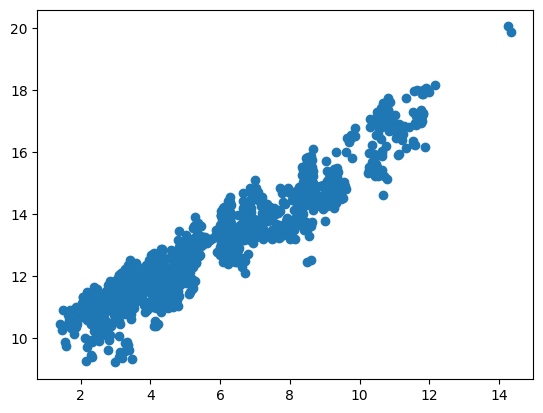

In [112]:
#Your code here
plt.scatter(x_kl,y_kl)

#### **Q5)** [[5 points]](https://) Use your gradient descent function to learn a linear regression model for the `x` and `y` above using the following parameters and plot the `cost_history` over the 1000 iterations.

```
g = the least_squares function you implemented.

w = [w_0, w_1], where w_0 and w_1 are random numbers between -0.1 and 0.1

max_its=1000

alpha=0.01
```

In [113]:
#Your code here
weight_history,cost_history,learned_theta = gradient_descent(g=least_squares, alpha=0.01, max_its=1000, w=[-0.1,0.1], x=x_kl, y=y_kl)

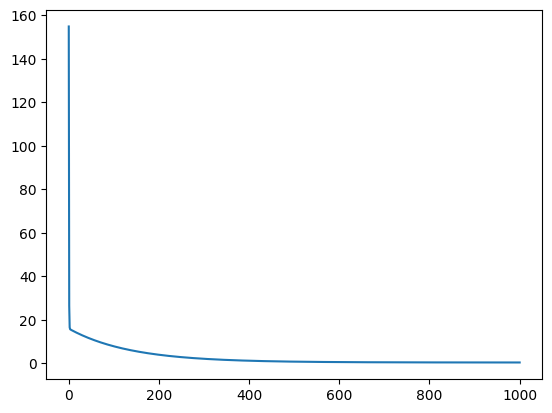

In [114]:
plt.plot(cost_history)

#### **Q6)** [[5 points]](https://) Use the learned weights from above (note that the "learned" weights are the ones with the lowest cost) to plot the learned line. You can use the *linspace* method (shown below) to generate a list of samples, `s`, that you can use for plotting. You need to compute the model predictions for each of the data points using the learned weights. On the same figure, also plot the scatter plot from Q4.

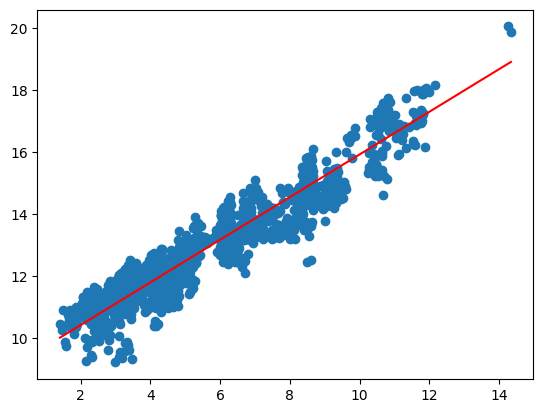

In [115]:
s = np.linspace(np.min(x_kl),np.max(x_kl))
#Your code here

predictions = model(s, learned_theta)

plt.plot(s, predictions, color='r') # need to make sure that we input the s here so it spaces the inputs of the model correctly!
plt.scatter(x_kl,y_kl)

#### **Q7)** [[1 point]](https://)  Run the code below to import a dataset. Then, plot a scatter plot of the data (`x` vs `y`).

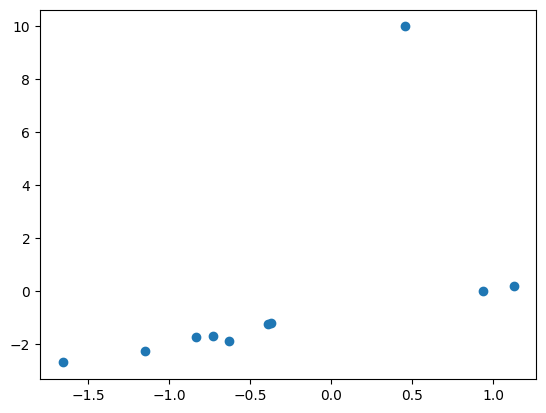

In [116]:
# load in dataset
data = np.loadtxt('regression_outliers.csv',delimiter = ',')
x = data[:-1,:]
y = data[-1:,:]

#Your code here
plt.scatter(x,y)

#### **Q8)** [[10 points]](https://) Implement the least absolute deviations function discussed in class. The function should take in an array of weights, `w`, an array of data points, `x`, and an array of the corresponding groundtruth, `y`. It should use the model function implemented in Q1 and return a float indicating the total cost.

In [117]:
def least_absolute_deviations(w,x,y):
  
  return np.mean(np.abs(model(x,w) - y))

#### **Q9)** [[5 points]](https://) Use the gradient descent function twice to learn two linear models using the new `x` and `y` from Q7 using the following parameters and plot the `cost_history` for both runs on the same plot. Make the plot for the first run *`orange`* and the plot for the second run *`blue`*.

#####**Run 1)**
```
g = least_squares function

w = [0.0,0.0]

max_its=100

alpha=0.01
```

#####**Run 2)**
```
g = least_absoulte_deviations

w = [0.0,0.0]

max_its=100

alpha=0.01
```

Learned model loss on least squares: 9.208380672234528
Learned model loss on abs: 1.509424148078382


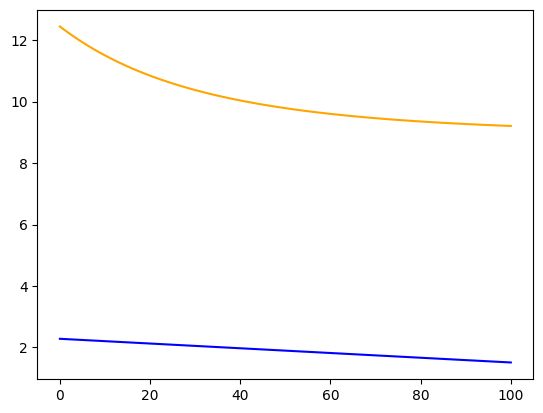

In [118]:
#Your code here
_, cost_history1, learned_theta1 = gradient_descent(least_squares, alpha=.01, max_its=100, w = [0.0,0.0], x=x, y=y)
_, cost_history2, learned_theta2 = gradient_descent(least_absolute_deviations, alpha=.01, max_its=100, w = [0.0,0.0], x=x, y=y)

plt.plot(cost_history1, color='orange')
plt.plot(cost_history2, color='blue')

print(f"Learned model loss on least squares: {least_squares(learned_theta1, x, y)}")
print(f"Learned model loss on abs: {least_absolute_deviations(learned_theta2, x, y)}")

#### **Q10)** [[5 points]](https://) Use the learned weights from above to plot the two learned lines (use same colors as above). You can use the *linspace* method again to generate a list of samples that you can use. On the same figure, also plot the scatter plot from Q7. Which of these lines look like a better fit to you?


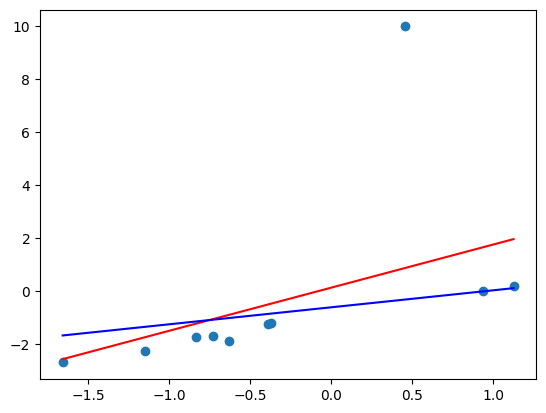

In [119]:
s = np.linspace(np.min(x),np.max(x))
#Your code here
model_ls = model(s, learned_theta1)
model_abs = model(s, learned_theta2)

plt.plot(s, model_ls, color="red")
plt.plot(s, model_abs, color="blue")
plt.scatter(x,y) 

# least abs div is a better fit

#### **Q11)** [[6 points]](https://) Implement the mean squared error (MSE) and the mean absolute deviation (MAD) functions from class. The functions should take in as input an array of actual ys, `y_actual`, and an array of predicted ys, `y_pred`, and return the prediction error.

In [120]:
def MSE(y_actual,y_pred):
    #Your code here
    return np.mean((y_actual - y_pred) ** 2)

def MAD(y_actual,y_pred):
    #Your code here
    return np.mean(np.abs(y_actual - y_pred))

#### **Q12)** [[4 points]](https://) Use the functions above to report the MSE and MAD for the two models learned in Q9, using the `x` and `y` from Q7. You should have 4 values total, two for each model. Which model is doing better? (Note that since you are evaluating the model on the training data, this corresponds to the training error)

In [121]:
#Your code here
pred_ls = model(x, learned_theta1)
pred_abs = model(x, learned_theta2)

# model that was trained with the least squares loss:
MSE_ls = MSE(y, pred_ls)
MAD_ls = MAD(y, pred_ls)

# model that was trained with the mean absolute dev
MSE_abs = MSE(y, pred_abs)
MAD_abs = MAD(y, pred_abs)

print(f"MSE on Least Squares loss: {MSE_ls}")
print(f"MSE on Abs loss: {MSE_abs}")
print(f"MAD on Least Squares loss: {MAD_ls}")
print(f"MAD on Abs loss: {MAD_abs}")

# makes sense that each model is doing better on the metric it was trained for!

MSE on Least Squares loss: 9.208380672234528
MSE on Abs loss: 10.986677067814977
MAD on Least Squares loss: 1.6783896724905574
MAD on Abs loss: 1.509424148078382


## Nonlinear Regression

####**Q13)** [[5 points]](https://) Implement feature transformation function, `b()`, that takes an array of data points, `x`, and an index `i` to return an array of transformed features for `x`, where $b(x, i) = x^i$. You can assume there is only one feature for each data point.

In [122]:
def b(x, i):
  # Your code here
    return x ** i

#### **Q14)** [[10 points]](https://) Implement the nonlinear regression model based on the equation below. The function (called `nonlinear_model`) takes in an array of data points, `x` , and an array of weights, `w`, and returns a vector `y_predicted` containing the linear combination for each of the data points. As discussed in class, your input `x` should be first transformed to a new feature space with the feature transformation function, `b`, you implemented in Q13. You can assume each data point in `x` only has one feature. The length of the vector being returned should be the same as `x`.

\begin{align}
f_{\mathbf{\theta}}(x)
&= w_0 + w_1 x + w_2 x^{2} + w_2 x^{3} + w_2 x^{4} \\
&= w_0 b_0(x)+ w_1 b_1(x) + w_2 b_2(x) + w_3 b_3(x) + w_4 b_4(x) \\
&= \sum_{i=0}^4 w_i b_i(x)
\end{align}


In [138]:
def nonlinear_model(x, w):
    
    print(f"We have {len(x)} Datapoints: {x}")
    
    f_theta = np.zeros_like(b(x,0))

    print(f"Shape of non_linear model: {f_theta.shape}")


    for i, theta_i in enumerate(w):

        print(i)
        print(f"{b(x,i)} | shape: {b(x,i).shape}")
        print(f"{theta_i}")
        print(f"\n")
        

        f_theta += theta_i * b(x,i) 
    return f_theta # vector of length equal to the number of datapoints

#### **Q15)** [[5 points]](https://) Complete the code below (`least_squares_nonlinear` function) by updating your `least_squares` function to utilize your `nonlinear_model`. Next, run the gradient descent function, using the `x` and `y` from Q7, with your `nonlinear_model` implemented in Q14. Use the following parameters and plot the cost_history.

```
g = least_squares_nonlinear function

w = [1.0, 1.0, 1.0, 1.0, 1.0]

max_its = 5000

alpha = 0.01
```

In [139]:
def least_squares_nonlinear(w,x,y):
  return np.mean((nonlinear_model(x,w) - y) ** 2)

In [140]:
#Your code here
_, cost_history_nonlinear, learned_theta_nonlinear = gradient_descent(least_squares_nonlinear, alpha=.01, max_its=5000, w = [1.0, 1.0, 1.0, 1.0, 1.0], x=x, y=y)

We have 1 Datapoints: [[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]]
Shape of non_linear model: (1, 10)
0
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]] | shape: (1, 10)
1.0


1
[[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]] | shape: (1, 10)
1.0


2
[[0.13851821 0.39703175 1.32416354 0.87164056 0.69218246 2.74561086
  1.26356036 0.15446456 0.53684245 0.20449798]] | shape: (1, 10)
1.0


3
[[-0.05155376 -0.25017151 -1.52374551  0.81377837 -0.57587852 -4.54944559
   1.42034547 -0.06070763 -0.39334196  0.09247696]] | shape: (1, 10)
1.0


4
[[0.01918729 0.15763421 1.75340908 0.75975726 0.47911655 7.53837897
  1.59658479 0.0238593  0.28819982 0.04181942]] | shape: (1, 10)
1.0


We have 1 Datapoints: [[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]]
Shape of non_linear model:

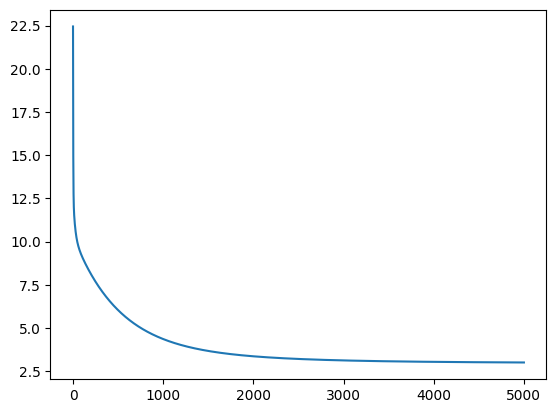

In [126]:
plt.plot(cost_history_nonlinear)

####**Q16)** [[5 points]](https://) Use the learned weights from above to plot the learned nonlinear model. You can use the linspace method again to generate a list of samples that you can use. On the same figure, also plot the scatter plot from Q7.

Datapoints: [-1.65698849 -1.60023195 -1.54347541 -1.48671887 -1.42996233 -1.37320579
 -1.31644925 -1.2596927  -1.20293616 -1.14617962 -1.08942308 -1.03266654
 -0.97591    -0.91915346 -0.86239692 -0.80564038 -0.74888384 -0.6921273
 -0.63537076 -0.57861421 -0.52185767 -0.46510113 -0.40834459 -0.35158805
 -0.29483151 -0.23807497 -0.18131843 -0.12456189 -0.06780535 -0.01104881
  0.04570773  0.10246428  0.15922082  0.21597736  0.2727339   0.32949044
  0.38624698  0.44300352  0.49976006  0.5565166   0.61327314  0.67002968
  0.72678622  0.78354276  0.84029931  0.89705585  0.95381239  1.01056893
  1.06732547  1.12408201]
Shape of non_linear model: (50,)
0
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1.] | shape: (50,)
3.604589274355223


1
[-1.65698849 -1.60023195 -1.54347541 -1.48671887 -1.42996233 -1.37320579
 -1.31644925 -1.2596927  -1.20293616 -1.14617962 -1.08942308 -1.03266654
 -0.975

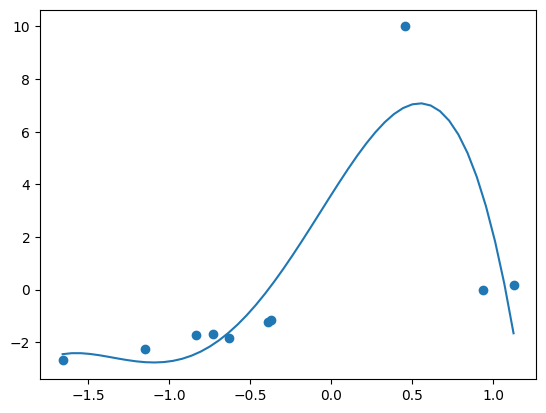

In [127]:
s = np.linspace(np.min(x),np.max(x))

y_hat = nonlinear_model(s, learned_theta_nonlinear)

plt.scatter(x,y)
plt.plot(s,y_hat)

## Regularizations

#### **Q17)** [[6 points]](https://) Implement the L1 and L2 regularizers from class. Recall the regularizers take in input the weight vector and return a score based on the L1 or L2 norm of the weights.

In [128]:
import autograd.numpy as np
from autograd.numpy import linalg
def L2_regularizer(w):
  #Your code here
  w = np.array(w)
  return np.sqrt(np.sum(w ** 2))

def L1_regularizer(w):
  #Your code here
  w = np.array(w)
  return np.sum(np.abs(w))

#### **Q18)** [[10 points]](https://) Turn the least squares function implemented in Q2 into the Ridge (L2) and Lasso (L1) least squares (*covered in class*) using the functions implemented in Q17. Recall that $\lambda$ is used as a hyperparameter to specify the smoothness of the function learned (higher $\lambda$ leads to simpler and smoother functions whereas lower $\lambda$ leads to better fitting to the data. $\lambda=0$ is the same as non-regularized least-squares)

In [129]:
def ridge(w,x,y,lmbda=0.0):
  #your code here
  return least_squares(w,x,y) + lmbda * L2_regularizer(w)

def lasso(w,x,y,lmbda=0.0):
  #your code here
  return least_squares(w,x,y) + lmbda * L1_regularizer(w)

####**Q19)** [[8 points]](https://) Run the gradient descent function twice, using the `x` and `y` from Q7, with your `nonlinear_model` using the following parameters. Use the cost functions you implemented in Q18, and Plot the cost_history for both runs. Make the plot for the first run *`orange`* and the plot for the second run *`blue`*. Note that you have to also update your gradient descent function to take $\lambda$ as input.


#####**Run 1)**
```
g = ridge

w = [1.0, 1.0, 1.0, 1.0, 1.0]

max_its = 100

alpha = 0.01

lmbda = 0.1
```

####**Run 2)**
```
g = lasso

w = [1.0, 1.0, 1.0, 1.0, 1.0]

max_its = 100

alpha = 0.01

lmbda = 0.1
```

In [130]:
def nonlinear_ridge(w,x,y,lmbda=0.0):
  #your code here
  return least_squares_nonlinear(w,x,y) + lmbda * L2_regularizer(w)

def nonlinear_lasso(w,x,y,lmbda=0.0):
  #your code here
  return least_squares_nonlinear(w,x,y) + lmbda * L1_regularizer(w)

In [131]:
def gradient_descent_with_lmbda(g,alpha,max_its,w,x,y,lmbda=0.0):
    
    gradient = grad(g)   ## This is how you use the autograd library to find the gradient of a function  

    theta = w
    weight_history = [theta]
    cost_history = [g(theta,x,y,lmbda)]

    for _ in range(max_its):
        theta = theta - (alpha * np.array(gradient(theta, x, y)))
        weight_history.append(theta)
        cost_history.append(g(theta,x,y,lmbda))

    return weight_history,cost_history,theta

In [132]:
#Your code here
_, cost_history_nonlinear_ridge, ridge_theta = gradient_descent_with_lmbda(nonlinear_ridge, alpha=.01, max_its=100, w = [1.0, 1.0, 1.0, 1.0, 1.0], x=x, y=y, lmbda=0.1)
_, cost_history_nonlinear_lasso, lasso_theta = gradient_descent_with_lmbda(nonlinear_lasso, alpha=.01, max_its=100, w = [1.0, 1.0, 1.0, 1.0, 1.0], x=x, y=y, lmbda=0.1)

Datapoints: [[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]]
Shape of non_linear model: (1, 10)
0
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]] | shape: (1, 10)
1.0


1
[[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]] | shape: (1, 10)
1.0


2
[[0.13851821 0.39703175 1.32416354 0.87164056 0.69218246 2.74561086
  1.26356036 0.15446456 0.53684245 0.20449798]] | shape: (1, 10)
1.0


3
[[-0.05155376 -0.25017151 -1.52374551  0.81377837 -0.57587852 -4.54944559
   1.42034547 -0.06070763 -0.39334196  0.09247696]] | shape: (1, 10)
1.0


4
[[0.01918729 0.15763421 1.75340908 0.75975726 0.47911655 7.53837897
  1.59658479 0.0238593  0.28819982 0.04181942]] | shape: (1, 10)
1.0


Datapoints: [[-0.37218035 -0.63010455 -1.15072305  0.93361692 -0.83197503 -1.65698849
   1.12408201 -0.39301979 -0.73269533  0.45221453]]
Shape of non_linear model: (1, 10)
0
[[1. 1. 1

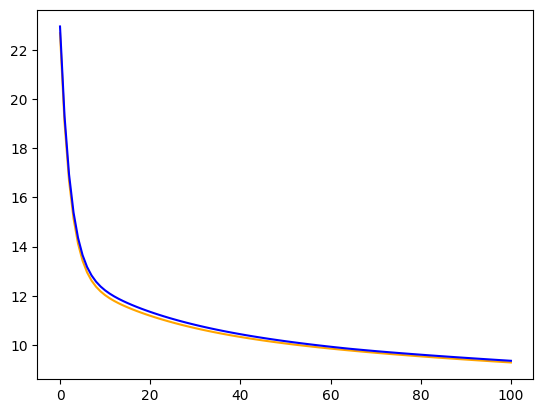

In [133]:
plt.plot(cost_history_nonlinear_ridge, color='orange')
plt.plot(cost_history_nonlinear_lasso, color='blue')

Datapoints: [-1.65698849 -1.60023195 -1.54347541 -1.48671887 -1.42996233 -1.37320579
 -1.31644925 -1.2596927  -1.20293616 -1.14617962 -1.08942308 -1.03266654
 -0.97591    -0.91915346 -0.86239692 -0.80564038 -0.74888384 -0.6921273
 -0.63537076 -0.57861421 -0.52185767 -0.46510113 -0.40834459 -0.35158805
 -0.29483151 -0.23807497 -0.18131843 -0.12456189 -0.06780535 -0.01104881
  0.04570773  0.10246428  0.15922082  0.21597736  0.2727339   0.32949044
  0.38624698  0.44300352  0.49976006  0.5565166   0.61327314  0.67002968
  0.72678622  0.78354276  0.84029931  0.89705585  0.95381239  1.01056893
  1.06732547  1.12408201]
Shape of non_linear model: (50,)
0
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1.] | shape: (50,)
0.4198496390336509


1
[-1.65698849 -1.60023195 -1.54347541 -1.48671887 -1.42996233 -1.37320579
 -1.31644925 -1.2596927  -1.20293616 -1.14617962 -1.08942308 -1.03266654
 -0.97

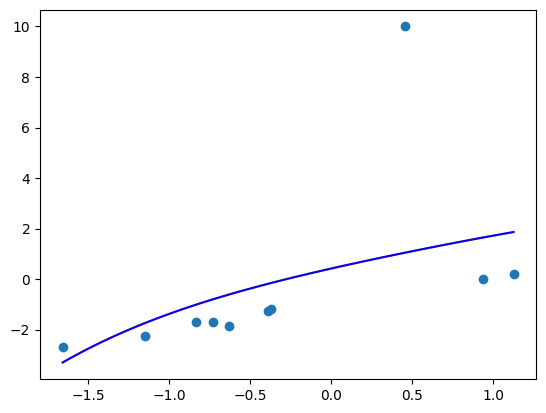

In [134]:
s = np.linspace(np.min(x),np.max(x))

ridge_hat = nonlinear_model(s, ridge_theta)
lasso_hat = nonlinear_model(s, lasso_theta)

plt.plot(s, ridge_hat, color="orange")
plt.plot(s, lasso_hat, color="blue")
plt.scatter(x,y)

## SKLearn and Feature Selection

#### **Q20)** [[2 points]](https://) The file `'weatherHistory.csv'` has 96,454 lines, each one corresponding to a data point. Each row (i.e., data point), has several columns. Read the data file. Note that the first line is the header describing each column.

In [135]:
import csv
#Your code here
csvname = 'weatherHistory.csv'
with open(csvname, mode='r') as file:
    reader = csv.reader(file, delimiter=',')
    file = list(reader)
    cols = file[0]
    data = file[1:]
    
print(cols)
print(len(data))
print(data[0])


['Date', 'Summary', 'Precip', 'Temperature', 'Apparent_Temperature', 'Humidity', 'Wind_Speed', 'Wind_Bearing', 'Visibility', 'Loud_Cover', 'Pressure', 'Daily_Summary']
96453
['2006-04-01 00:00:00.000 +0200', 'Partly Cloudy', 'rain', '9.472222222222221', '7.3888888888888875', '0.89', '14.1197', '251.0', '15.826300000000002', '0.0', '1015.13', 'Partly cloudy throughout the day.']


#### **Q21)** [[5 points]](https://) Use the data above to set `y` to be the temperatures and `X` to be the following columns (in order): `[Apparent_Temperature, Humidity, Wind_Speed, Wind_Bearing, Pressure]` Basically, we want to see whether we can predict the temperature, using the features in `X`.

In [136]:
#Your code here
features_index = {4,5,6,7,10} # indexs corresponding to the features we want

new_data = []
targets = []

for datapoint in data:
    new_datapoint = []
    for i, feature in enumerate(datapoint):
        if i == 3: targets.append(float(feature))
        if i in features_index: new_datapoint.append(float(feature))
    new_data.append(new_datapoint)

X = np.array(new_data)
Y = np.array(targets)

print(len(X))
print(len(Y))
print(len(X[0]))
print(X[0]) # double checking to make sure we did this data right


96453
96453
5
[7.38888889e+00 8.90000000e-01 1.41197000e+01 2.51000000e+02
 1.01513000e+03]


#### We are now going to use a well-known ML library called ***sklearn***. If you do not have it installed, please do so using this instruction: https://scikit-learn.org/stable/install.html

#### sklearn comes with many models already implemented, below we import the standard linear regression, Ridge, and Lasso models from sklearn. We also import a method that can divide our data into train/test sets. Please run the cell below.

In [137]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso

ModuleNotFoundError: No module named 'sklearn'

#### This library is very easy to use. Please use the API and user guide (https://scikit-learn.org) to learn exactly how to use this library. For instance, learning a linear regression model using sklearn can be done in two lines:

```
linearModel = LinearRegression()
linearModel.fit(x_train, y_train)
```

#### **Q22)** [[2 points]](https://) Use the `train_test_split` to divide your modified data from Q21 into 80% train, 20% test.

In [ ]:
#Your code here
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=.20, random_state=42)

#### **Q23)** [[10 points]](https://) Use sklearn to train a LinearRegression model using the data above. Report the performance of the model on the test data (use sklearn's MSE implementation: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html). Note that the `.predict` method can be used to get the y_predictions for the test xs.

In [ ]:
from sklearn.metrics import mean_squared_error

linearModel = LinearRegression()
linearModel.fit(x_train, y_train)

y_hat = linearModel.predict(x_test)

mse = mean_squared_error(y_test, y_hat)
print(mse)

0.8998694775524557


#### **Q24)** [[10 points]](https://) Repeat Q23 but instead of LinearRegression, use the Ridge and Lasso functions. You can keep the default alpha (note that what we called lambda in the class, the hyperparameter for regularization, is called alpha in sklearn. It is the same thing).

In [ ]:
#Your code here
from sklearn.metrics import mean_squared_error

ridgeModel = Ridge()
lassoModel = Lasso()

ridgeModel.fit(x_train, y_train)
lassoModel.fit(x_train, y_train)

y_hat_ridge = ridgeModel.predict(x_test)
y_hat_lasso = lassoModel.predict(x_test)

mse_ridge = mean_squared_error(y_test, y_hat_ridge)
mse_lasso = mean_squared_error(y_test, y_hat_lasso)

print(mse_ridge)
print(mse_lasso)

0.89987028936411
0.9788272422479269


#### **Q25)** [[5 points]](https://) Print the learned parameters for the Ridge and Lasso models (using `.coef_`).  Note that the parameters below correspond to the feature vector (`[Apparent_Temperature, Humidity, Wind_Speed, Wind_Bearing, Pressure]`), in order. I.e., the first value corresponds to `Apparent_Temperature`, etc. What is the difference between the Ridge and Lasso parameters? Which features, if any, have been eliminated by Lasso?

In [ ]:
#Your code here
print(ridgeModel.coef_)
print(lassoModel.coef_)

#Lasso illiminated the humidity feature from the prediction of tempurature!

[ 8.73491798e-01 -1.45297638e+00  8.01516368e-02 -3.92415120e-04
 -1.85889492e-04]
[ 8.80306700e-01 -0.00000000e+00  6.88636339e-02 -2.53472380e-04
 -1.56887212e-04]


\# Your answer